<a href="https://colab.research.google.com/github/Yagamzook302/SP-MUSIC_AI/blob/main/PROYECTO_AI1_2023_2_SP_MUSIC_AI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# **Proyecto AI | SP-MUSIC_AI**

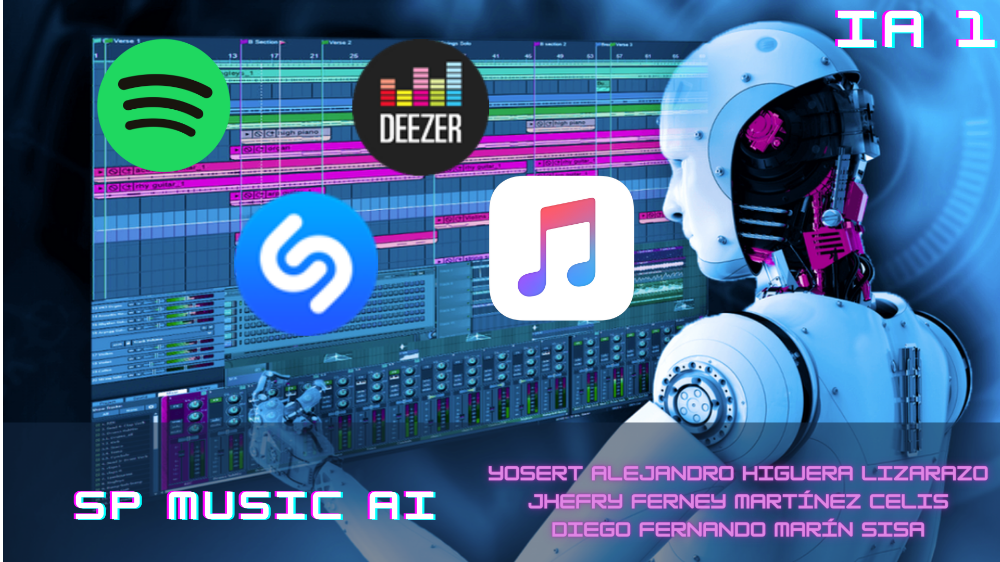

Crear un sistema de recomendación del top 10 de las canciones más famosas hasta 2023 en Spotify y otras plataformas, con características adicionales más detalladas que otros conjuntos de datos similares basandonos en la popularidad de reproducción o streams.

 # **INTEGRANTES**
 *Yosert Alejandro Higuera Lizarazo - 2205003*

*Jhefry Ferney Martínez Celis - 2205002*

*Diego Fernando Marín Sisa - 2204005*

# **Primer Entrega**

* **Librerias**

In [ ]:
!pip install seaborn matplotlib
from google.colab import files
import pandas as pd
import numpy as np
import xlrd
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
from mpl_toolkits.mplot3d import Axes3D
import random
import warnings
warnings.filterwarnings("ignore")
import imageio
import plotly as py
import plotly.express as px
import sqlite3
import plotly.graph_objects as go
from plotly.offline import iplot, init_notebook_mode
import cufflinks
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import OrdinalEncoder
from sklearn.metrics import mean_squared_error
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
import statsmodels.formula.api as smf
from IPython.display import HTML
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
import seaborn as sns
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

* **Montaje en Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


* **Carga del DataSet "spmusic.csv"**

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/spmusic.csv', encoding='latin1')
df

,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,...,in_deezer_charts,in_shazam_charts,bpm,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,Seven (feat. Latto) (Explicit Ver.),Latto,2,2023,7,14,553,147,141381703,43,...,10,826.0,125,80,89,83,31,0,8,4
1,LALA,Myke Towers,1,2023,3,23,1474,48,133716286,48,...,14,382.0,92,71,61,74,7,0,10,4
2,vampire,Olivia Rodrigo,1,2023,6,30,1397,113,140003974,94,...,14,949.0,138,51,32,53,17,0,31,6
3,Cruel Summer,Taylor Swift,1,2019,8,23,7858,100,800840817,116,...,12,548.0,170,55,58,72,11,0,11,15
4,WHERE SHE GOES,Bad Bunny,1,2023,5,18,3133,50,303236322,84,...,15,425.0,144,65,23,80,14,63,11,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
948,My Mind & Me,Selena Gomez,1,2022,11,3,953,0,91473363,61,...,1,0.0,144,60,24,39,57,0,8,3
949,Bigger Than The Whole Sky,Taylor Swift,1,2022,10,21,1180,0,121871870,4,...,0,0.0,166,42,7,24,83,1,12,6
950,A Veces (feat. Feid),Feid,2,2022,11,3,573,0,73513683,2,...,0,0.0,92,80,81,67,4,0,8,6
951,En La De Ella,Feid,3,2022,10,20,1320,0,133895612,29,...,0,0.0,97,82,67,77,8,0,12,5


* **Modificación** <br>

  *Valores de tipo object en la lista de canciones "track_name" fueron modificados con un ID y* *almacenados en un nuevo .csv*

In [ ]:
df.reset_index(drop=True, inplace=True)

artist_set = set()
for artists in df['artist(s)_name'].str.split(','):
    if isinstance(artists, list):  # Verificar si artists es una lista válida
        for artist in artists:
            artist_set.add(artist.strip())

artist_to_id = {artist: i + 1 for i, artist in enumerate(artist_set)}

df['track_id'] = list(range(1, len(df) + 1))

def replace_names_with_ids(names, id_mapping):
    if isinstance(names, str):  # Verificar si names es una cadena válida
        return [id_mapping[name.strip()] for name in names.split(',')]
    else:
        return []

df['artist(s)_id'] = df['artist(s)_name'].apply(lambda x: replace_names_with_ids(x, artist_to_id))

# Tomar el primer elemento de la lista como el valor para 'artist(s)_id'
df['artist(s)_id'] = df['artist(s)_id'].apply(lambda x: x[0] if isinstance(x, list) and len(x) > 0 else None)

# Convertir la columna 'artist(s)_id' a tipo numérico
df['artist(s)_id'] = pd.to_numeric(df['artist(s)_id'], errors='coerce')

df.to_csv('spmusic_modified.csv', index=False)

In [ ]:
df

,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,...,bpm,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%,track_id,artist(s)_id
0,Seven (feat. Latto) (Explicit Ver.),Latto,2,2023,7,14,553,147,141381703,43,...,125,80,89,83,31,0,8,4,1,17
1,LALA,Myke Towers,1,2023,3,23,1474,48,133716286,48,...,92,71,61,74,7,0,10,4,2,243
2,vampire,Olivia Rodrigo,1,2023,6,30,1397,113,140003974,94,...,138,51,32,53,17,0,31,6,3,292
3,Cruel Summer,Taylor Swift,1,2019,8,23,7858,100,800840817,116,...,170,55,58,72,11,0,11,15,4,44
4,WHERE SHE GOES,Bad Bunny,1,2023,5,18,3133,50,303236322,84,...,144,65,23,80,14,63,11,6,5,333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
948,My Mind & Me,Selena Gomez,1,2022,11,3,953,0,91473363,61,...,144,60,24,39,57,0,8,3,949,351
949,Bigger Than The Whole Sky,Taylor Swift,1,2022,10,21,1180,0,121871870,4,...,166,42,7,24,83,1,12,6,950,44
950,A Veces (feat. Feid),Feid,2,2022,11,3,573,0,73513683,2,...,92,80,81,67,4,0,8,6,951,275
951,En La De Ella,Feid,3,2022,10,20,1320,0,133895612,29,...,97,82,67,77,8,0,12,5,952,275


* **Columnas en el DataSet**

In [ ]:
column_names = df.columns

print(column_names)
df.info()

Index(['track_name', 'artist(s)_name', 'artist_count', 'released_year',
       'released_month', 'released_day', 'in_spotify_playlists',
       'in_spotify_charts', 'streams', 'in_apple_playlists', 'in_apple_charts',
       'in_deezer_playlists', 'in_deezer_charts', 'in_shazam_charts', 'bpm',
       'danceability_%', 'valence_%', 'energy_%', 'acousticness_%',
       'instrumentalness_%', 'liveness_%', 'speechiness_%', 'track_id',
       'artist(s)_id'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 953 entries, 0 to 952
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   track_name            953 non-null    object 
 1   artist(s)_name        953 non-null    object 
 2   artist_count          953 non-null    int64  
 3   released_year         953 non-null    int64  
 4   released_month        953 non-null    int64  
 5   released_day          953 non-null    int64  
 6   in

In [ ]:
df

,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,...,bpm,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%,track_id,artist(s)_id
0,Seven (feat. Latto) (Explicit Ver.),Latto,2,2023,7,14,553,147,141381703,43,...,125,80,89,83,31,0,8,4,1,17
1,LALA,Myke Towers,1,2023,3,23,1474,48,133716286,48,...,92,71,61,74,7,0,10,4,2,243
2,vampire,Olivia Rodrigo,1,2023,6,30,1397,113,140003974,94,...,138,51,32,53,17,0,31,6,3,292
3,Cruel Summer,Taylor Swift,1,2019,8,23,7858,100,800840817,116,...,170,55,58,72,11,0,11,15,4,44
4,WHERE SHE GOES,Bad Bunny,1,2023,5,18,3133,50,303236322,84,...,144,65,23,80,14,63,11,6,5,333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
948,My Mind & Me,Selena Gomez,1,2022,11,3,953,0,91473363,61,...,144,60,24,39,57,0,8,3,949,351
949,Bigger Than The Whole Sky,Taylor Swift,1,2022,10,21,1180,0,121871870,4,...,166,42,7,24,83,1,12,6,950,44
950,A Veces (feat. Feid),Feid,2,2022,11,3,573,0,73513683,2,...,92,80,81,67,4,0,8,6,951,275
951,En La De Ella,Feid,3,2022,10,20,1320,0,133895612,29,...,97,82,67,77,8,0,12,5,952,275


* **Matriz de correlación**

  *Relación existente entre las columnas del DataSet.*

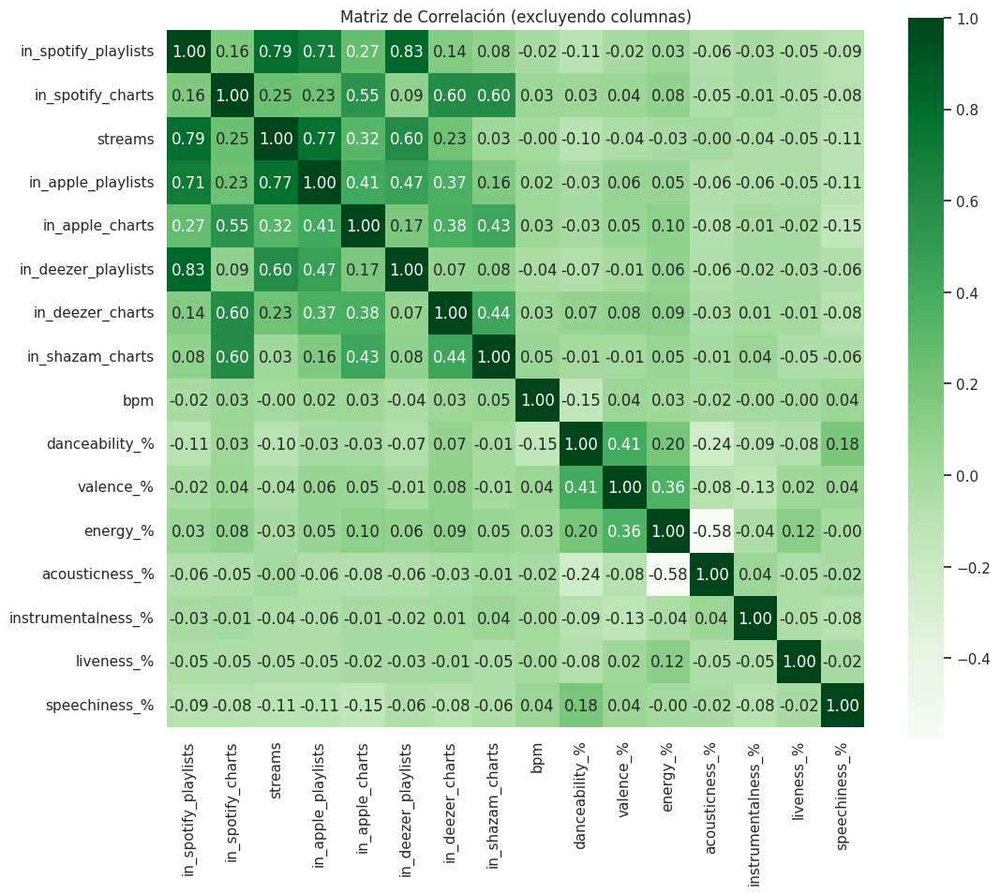

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Lista de columnas a excluir con posibles espacios adicionales
columnas_a_excluir = ['artist_count', 'track_id ', 'artist(s)_id ', 'released_year', 'released_month', 'released_day ']

columnas_a_excluir = [columna.strip() for columna in columnas_a_excluir]

df_sin_columnas_excluidas = df.drop(columns=columnas_a_excluir)

# Calcular la matriz de correlación para el DataFrame modificado
correlation_matrix = df_sin_columnas_excluidas.corr()

# Plotear la matriz de correlación
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='Greens', fmt='.2f', square=True)
plt.title('Matriz de Correlación (excluyendo columnas)')
plt.show()


* **Gráfica de Dispersión de Datos**

  *Es una representación visual de datos que muestra la relación entre dos variables*

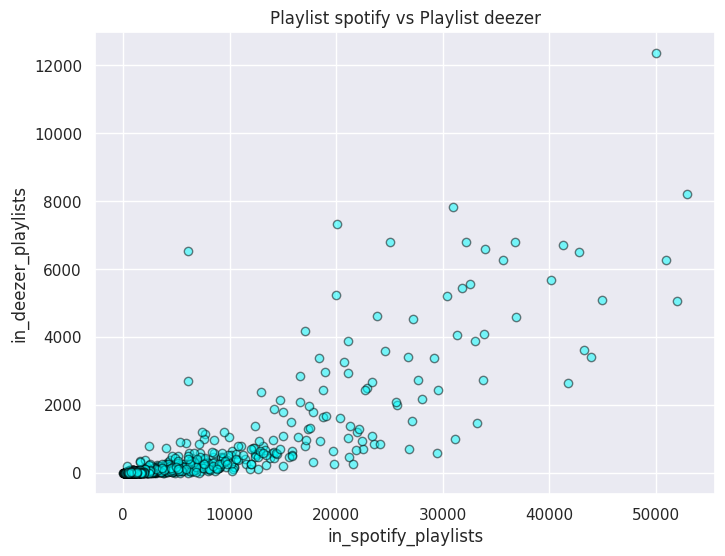

In [ ]:
import matplotlib.pyplot as plt

in_spotify_playlists_for = df['in_spotify_playlists']
in_deezer_playlists_for = df['in_deezer_playlists']

plt.figure(figsize=(8, 6))

plt.scatter(in_spotify_playlists_for, in_deezer_playlists_for, alpha=0.5, color='aqua', edgecolor='black')

plt.title('Playlist spotify vs Playlist deezer')
plt.xlabel('in_spotify_playlists')
plt.ylabel('in_deezer_playlists')

plt.show()


* **Scatter de visualización**

  *Se procede al desarrollo un Scatter ya que es una forma efectiva de visualizar la relación entre dos o más variables en tus datos.*

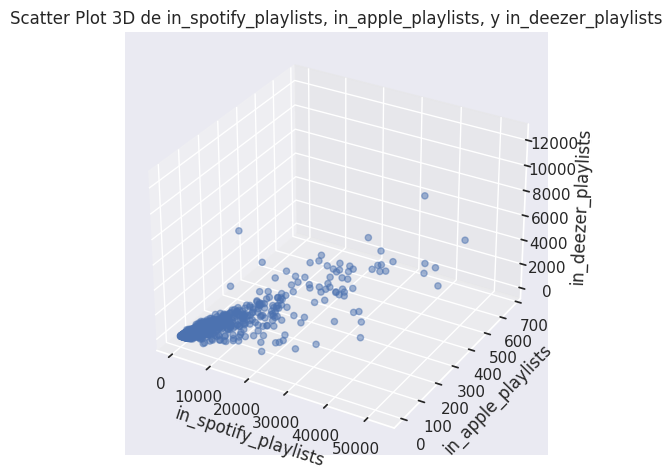

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Variables que queremos comparar "se sustituyen según el análisis".
variable_x = 'in_spotify_playlists'
variable_y = 'in_apple_playlists'
variable_z = 'in_deezer_playlists'

fig = plt.figure(figsize=(12, 15))
ax = fig.add_subplot(122, projection='3d')
ax.scatter(df[variable_x], df[variable_y], df[variable_z], c='b', marker='o', alpha=0.5)

ax.set_xlabel(f'{variable_x}')
ax.set_ylabel(variable_y)
ax.set_zlabel(variable_z)

plt.title(f'Scatter Plot 3D de {variable_x}, {variable_y}, y {variable_z}')
plt.show()

  *Modificación columna 'streams' como un array.*

In [ ]:
df_spmusic = df

In [ ]:
columna_region = df_spmusic['streams'].values.reshape(-1, 1)

ordinal_encoder = OrdinalEncoder()
columna_region_codificada = ordinal_encoder.fit_transform(columna_region)

df_spmusic['streams'] = columna_region_codificada.flatten()

print(df_spmusic.shape)
print(df_spmusic['streams'].dtype)
df_spmusic.head(10)

(953, 24)
float64


,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,...,bpm,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%,track_id,artist(s)_id
0,Seven (feat. Latto) (Explicit Ver.),Latto,2,2023,7,14,553,147,238.0,43,...,125,80,89,83,31,0,8,4,1,17
1,LALA,Myke Towers,1,2023,3,23,1474,48,216.0,48,...,92,71,61,74,7,0,10,4,2,243
2,vampire,Olivia Rodrigo,1,2023,6,30,1397,113,235.0,94,...,138,51,32,53,17,0,31,6,3,292
3,Cruel Summer,Taylor Swift,1,2019,8,23,7858,100,754.0,116,...,170,55,58,72,11,0,11,15,4,44
4,WHERE SHE GOES,Bad Bunny,1,2023,5,18,3133,50,494.0,84,...,144,65,23,80,14,63,11,6,5,333
5,Sprinter,Dave,2,2023,6,1,2186,91,316.0,67,...,141,92,66,58,19,0,8,24,6,166
6,Ella Baila Sola,Eslabon Armado,2,2023,3,16,3090,50,736.0,34,...,148,67,83,76,48,0,8,3,7,216
7,Columbia,Quevedo,1,2023,7,7,714,43,66.0,25,...,100,67,26,71,37,0,11,4,8,245
8,fukumean,Gunna,1,2023,5,15,1096,83,145.0,60,...,130,85,22,62,12,0,28,9,9,274
9,La Bebe - Remix,Peso Pluma,2,2023,3,17,2953,44,663.0,49,...,170,81,56,48,21,0,8,33,10,9


* **Scatters de columnas vs columnas**

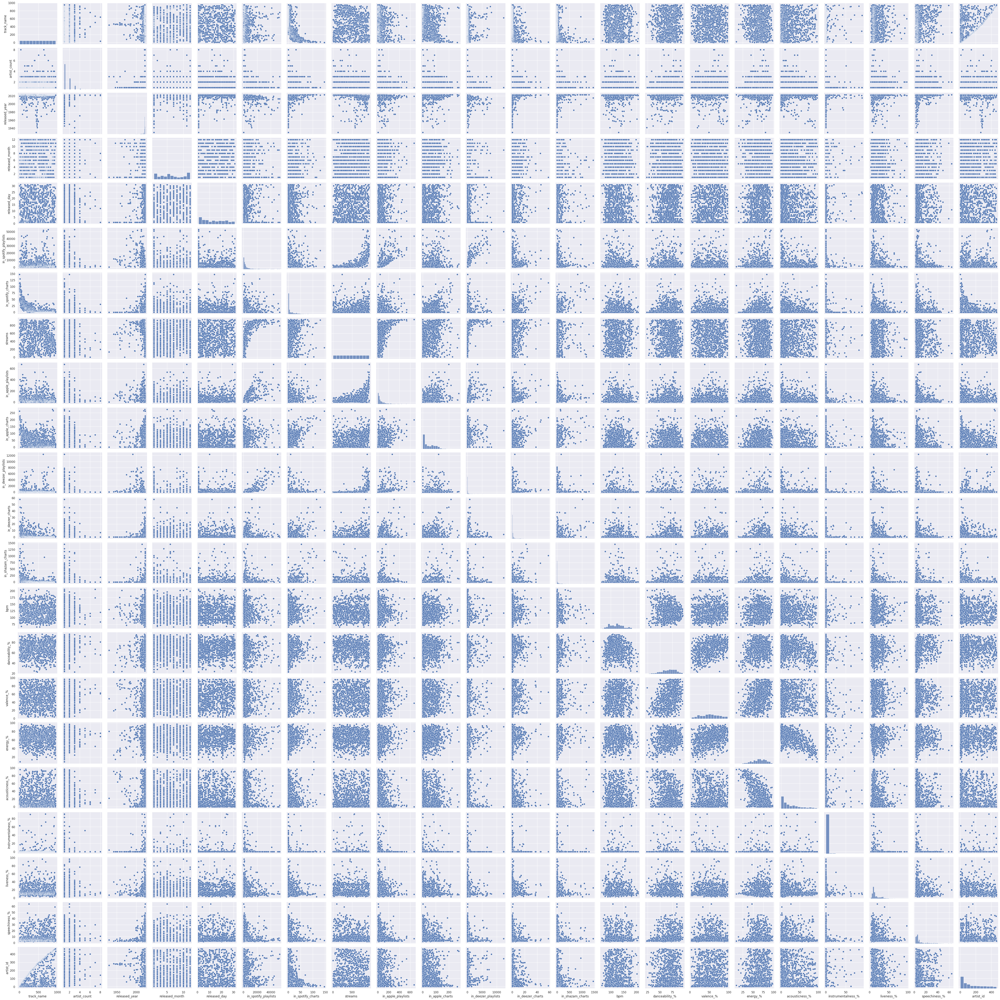

(953, 22) (953, 1)


,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,...,in_shazam_charts,bpm,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%,artist_id
0,1,Latto,2,2023,7,14,553,147,238.0,43,...,826.0,125,80,89,83,31,0,8,4,1.0
1,2,Myke Towers,1,2023,3,23,1474,48,216.0,48,...,382.0,92,71,61,74,7,0,10,4,2.0
2,3,Olivia Rodrigo,1,2023,6,30,1397,113,235.0,94,...,949.0,138,51,32,53,17,0,31,6,3.0
3,4,Taylor Swift,1,2019,8,23,7858,100,754.0,116,...,548.0,170,55,58,72,11,0,11,15,4.0
4,5,Bad Bunny,1,2023,5,18,3133,50,494.0,84,...,425.0,144,65,23,80,14,63,11,6,5.0


In [ ]:
X = df_spmusic.values[:, 1:]
y = df_spmusic.values[:, [1]]

sns.set(rc={'figure.figsize': (15, 15)})

sns.pairplot(df_spmusic, diag_kind="hist")  # Tenemos kind="kde"

plt.show()

print(X.shape, y.shape)

df_spmusic.head(5)

* **Scatter 3x3 relaciones**

  *Comparación entre las playlist de apple, deezer y spotify.*

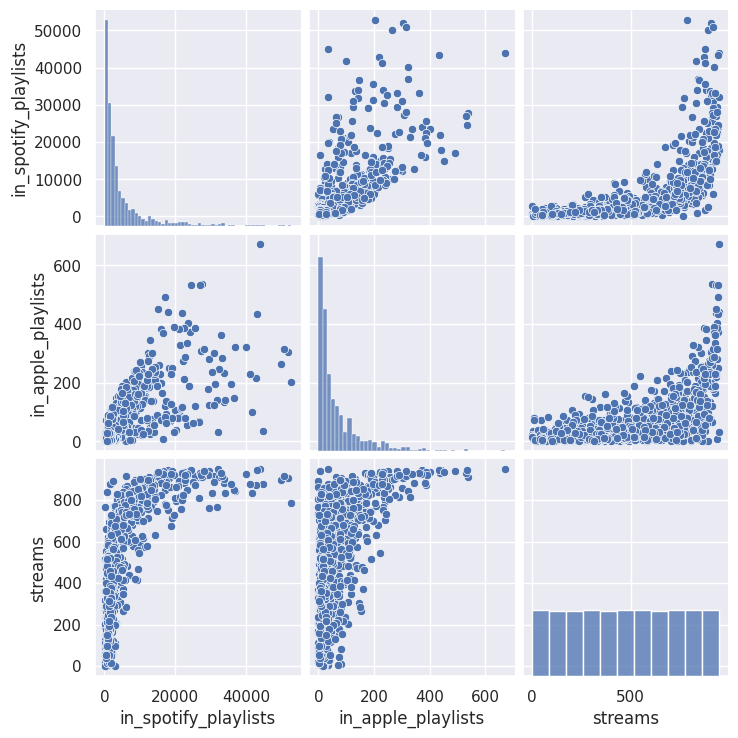

(953, 3)


,in_spotify_playlists,in_apple_playlists,streams
0,553,43,238.0
1,1474,48,216.0
2,1397,94,235.0
3,7858,116,754.0
4,3133,84,494.0


In [ ]:
columns_of_interest = ["in_spotify_playlists", "in_apple_playlists", "streams"]
X = df_spmusic[columns_of_interest].values

sns.set(rc={'figure.figsize': (15, 15)})
sns.pairplot(df_spmusic[columns_of_interest], diag_kind="hist")  # kind="kde"

plt.show()

print(X.shape)
df_spmusic[columns_of_interest].head(5)


* **Scatter 4x4 relciones**

  *Relación entre las columnas que se deseen comparar y obtener su información en la tabla matriz de 4x4.*

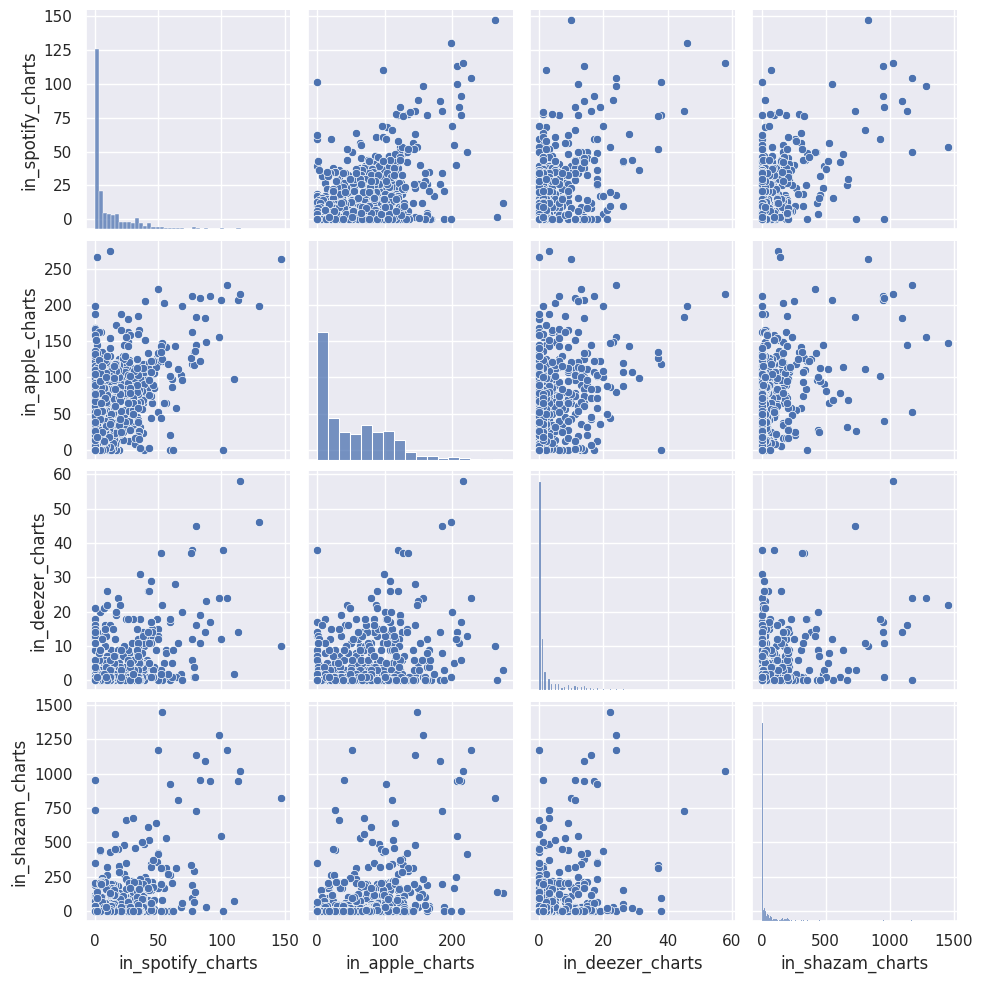

(953, 4)


,in_spotify_charts,in_apple_charts,in_deezer_charts,in_shazam_charts
0,147,263,10,826.0
1,48,126,14,382.0
2,113,207,14,949.0
3,100,207,12,548.0
4,50,133,15,425.0


In [ ]:
columns_of_interest = ["in_spotify_charts", "in_apple_charts", "in_deezer_charts", "in_shazam_charts"]
X = df_spmusic[columns_of_interest].values

sns.set(rc={'figure.figsize': (15, 15)})

sns.pairplot(df_spmusic[columns_of_interest], diag_kind="hist")  # kind="kde"

plt.show()

print(X.shape)
df_spmusic[columns_of_interest].head(5)

# **ENTREGABLE 2**

## **REGRESIÓN**

* **GAUSSIANNB**
  * *Permite visualizar un aproximación de los datos con respecto a las predicciones.*

El valor apróximado es: 0.545


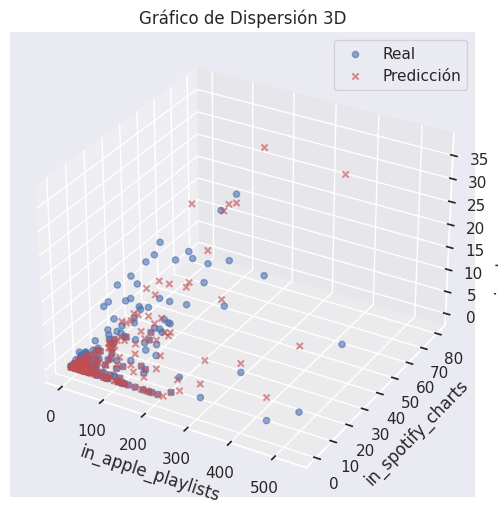

In [ ]:
X = df[['in_apple_playlists','in_spotify_charts']]
y = df[['in_deezer_charts']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
y_train = np.array(y_train).ravel()


est = GaussianNB()

est.fit(X_train,y_train)
print("El valor apróximado es: %.3f"%accuracy_score(est.predict(X_test), y_test))

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(6, 10))
ax = fig.add_subplot(111, projection='3d')

x = X_test['in_apple_playlists']
y = X_test['in_spotify_charts']
z_real = y_test
z_pred = est.predict(X_test)

ax.scatter(x, y, z_real, label='Real', c='b', marker='o', alpha=0.6)
ax.scatter(x, y, z_pred, label='Predicción', c='r', marker='x', alpha=0.6)

ax.set_xlabel('in_apple_playlists')
ax.set_ylabel('in_spotify_charts')
ax.set_zlabel('in_deezer_charts')
plt.legend()
plt.title('Gráfico de Dispersión 3D')
plt.show()

* **DECISIONTREEREGRESSOR**
  * *Permite observar los parámetros MSE, RMSE, MAE.*

MSE en el conjunto de prueba: 23.640623417751875
RMSE en el conjunto de prueba: 4.862162421983852
MAE en el conjunto de prueba: 3.199089772385436


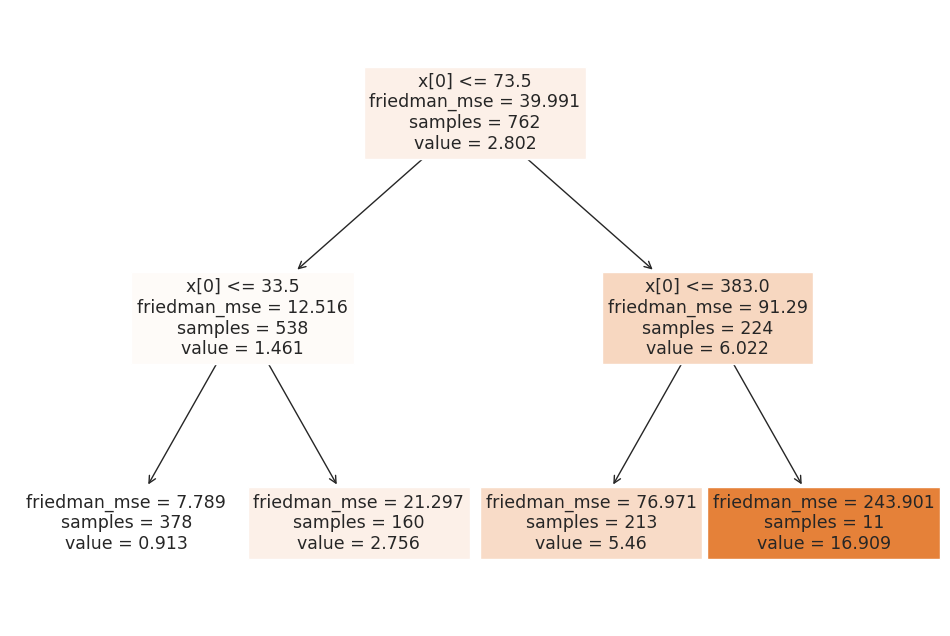

In [ ]:
X = df[['in_apple_playlists']]
y = df[['in_deezer_charts']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

max_depth = 2
criterion = 'friedman_mse'
clf = DecisionTreeRegressor(max_depth=max_depth, criterion=criterion)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print("MSE en el conjunto de prueba:", mse)

rmse = np.sqrt(mse)
print("RMSE en el conjunto de prueba:", rmse)

y_pred = clf.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
print("MAE en el conjunto de prueba:", mae)

from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
plot_tree(clf, filled=True)
plt.show()


* **REGRESIÓN LINEAL**
 * *Compatmiento referente a una línea respecto a los datos.*
 * *Observación: No sirve.*

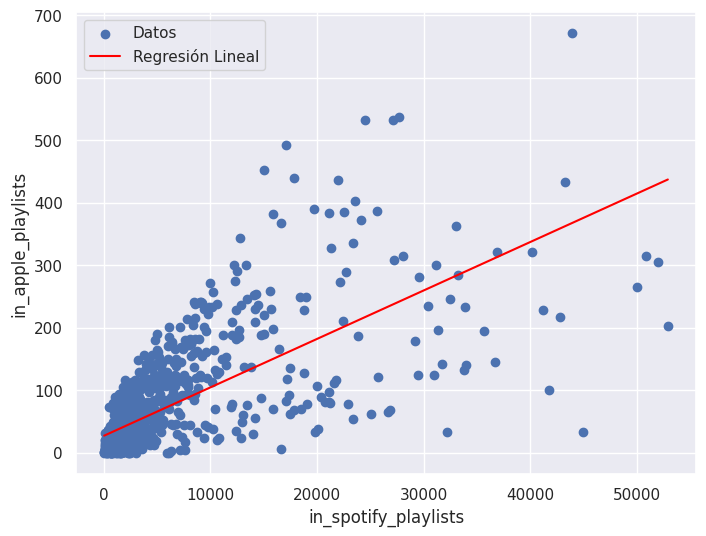

In [ ]:
linear_model = smf.ols(formula = 'in_apple_playlists ~ in_spotify_playlists', data = df).fit()

plt.figure(figsize=(8, 6))
plt.scatter(df['in_spotify_playlists'], df['in_apple_playlists'], label='Datos')

x_range = np.linspace(df['in_spotify_playlists'].min(), df['in_spotify_playlists'].max(), 100)

y_pred = linear_model.predict({'in_spotify_playlists': x_range})


plt.plot(x_range, y_pred, color='red', label='Regresión Lineal')

plt.xlabel('in_spotify_playlists')
plt.ylabel('in_apple_playlists')
plt.legend()

plt.show()

In [ ]:
linear_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     in_apple_playlists   R-squared:                       0.502
Model:                            OLS   Adj. R-squared:                  0.501
Method:                 Least Squares   F-statistic:                     957.3
Date:                Thu, 07 Dec 2023   Prob (F-statistic):          5.46e-146
Time:                        16:17:39   Log-Likelihood:                -5269.8
No. Observations:                 953   AIC:                         1.054e+04
Df Residuals:                     951   BIC:                         1.055e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               27.4993      2.368     11.611      0.000      22.852      32.147
in_spotify_playlists     0.0078      0.000     30.941      0.000       0.007       0.008
==============================================================================
Omnibus:                      263.559   Durbin-Watson:                   1.933
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1983.121
Skew:                           1.051   Prob(JB):                         0.00
Kurtosis:                       9.747   Cond. No.                     1.13e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.13e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
f = linear_model.predict(pd.DataFrame(df['in_spotify_playlists']))
f

0      31.786323
1      38.926180
2      38.329254
3      88.416785
4      51.787225
         ...    
948    34.887238
949    36.647008
950    31.941369
951    37.732328
952    33.561597
Length: 953, dtype: float64

* **SVC**
  * *Frontera de desición.*

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

X = df[['in_apple_playlists']]
y = df[['in_deezer_charts']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

y_train = np.array(y_train).ravel()
kernel = 'poly'
degree = 3
clf = SVC(kernel=kernel, degree=degree)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo: {accuracy}")

Precisión del modelo: 0.5706806282722513


## **CLASIFICACIÓN**

* **RAMDONFORESTCLASSIFIER**
  * *Clasificación a tres columnas.*

Precisión del modelo: 0.47643979057591623


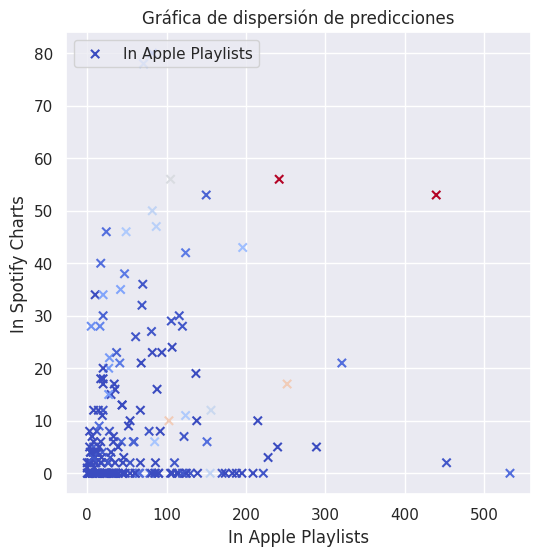

In [ ]:
X = df[['in_apple_playlists','in_spotify_charts']]
y = df[['in_deezer_charts']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

y_train = np.array(y_train).ravel()
n_estimators = 100
max_depth = 400
criterion = 'gini'
clf = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth, criterion=criterion)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo: {accuracy}")

ig = plt.figure(figsize=(6, 6))
plt.scatter(X_test['in_apple_playlists'], X_test['in_spotify_charts'], c=y_pred, cmap='coolwarm', marker='x')

# Add labels to the axes
plt.xlabel('In Apple Playlists')
plt.ylabel('In Spotify Charts')

# Add a legend
plt.legend(['In Apple Playlists', 'In Spotify Charts'], loc='upper left')

plt.title('Gráfica de dispersión de predicciones')
plt.show()

* **DT**
 * *Árbol decisión en la clasificación.*

Precisión del modelo: 0.5759162303664922


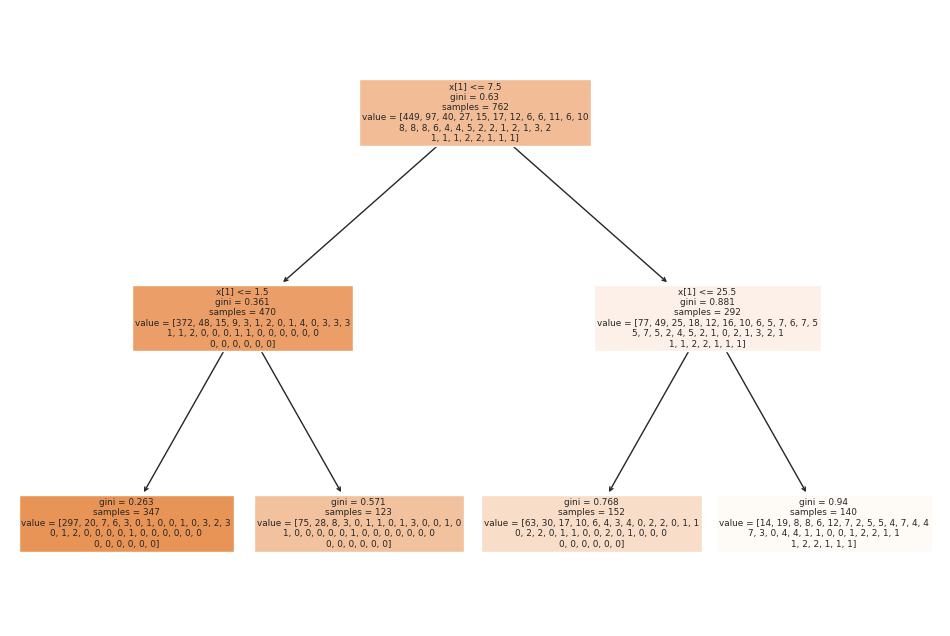

In [ ]:
X = df[['in_apple_playlists','in_spotify_charts']]
y = df[['in_deezer_charts']]
np.random.seed(20)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

max_depth = 2
criterion = 'gini'
clf = DecisionTreeClassifier(max_depth=max_depth, criterion=criterion)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión del modelo: {accuracy}")

from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
plot_tree(clf, filled=True)
plt.show()

# **ENTREGA FINAL**

* Partición de los datos en entrenamiento (80 %) y test (20 %)

In [ ]:
features = df.drop(['streams'], axis=1)
target = df['streams']


X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)


print("Forma del conjunto de entrenamiento:", X_train.shape)
print("Forma del conjunto de prueba:", X_test.shape)


Forma del conjunto de entrenamiento: (762, 23)
Forma del conjunto de prueba: (191, 23)


* Entrenamiento k-means (K=20) con el conjunto de entrenamiento.

In [ ]:
features_for_kmeans = X_train.select_dtypes(include=['int64', 'float64'])

features_for_kmeans_no_missing = features_for_kmeans.dropna()

y_train_no_missing = y_train[features_for_kmeans.index.isin(features_for_kmeans_no_missing.index)]
scaler = StandardScaler()
features_for_kmeans_no_missing_scaled = scaler.fit_transform(features_for_kmeans_no_missing)

kmeans_model = KMeans(n_clusters=20, random_state=42)

kmeans_model.fit(features_for_kmeans_no_missing_scaled)

etiquetas_entrenamiento = kmeans_model.labels_

etiquetas_entrenamiento


array([12,  4,  4, 14, 13,  2, 11, 19, 18, 12,  6,  0, 10, 17, 15,  1, 10,
       17,  1, 17,  4,  3,  1, 15, 11,  1, 15, 11, 11, 12,  3, 13,  3, 15,
       19, 12,  9,  7,  3,  1,  4, 13,  5,  2,  8,  4, 17,  9, 19,  6, 16,
       15, 11, 19, 17,  3,  1, 12, 19,  5,  7, 16, 15,  3, 12,  8,  2, 16,
        5,  5,  1, 18, 12,  3,  4, 15, 17,  4,  8,  4, 15,  0,  4,  4, 18,
       19,  1,  7, 17,  1, 18,  0, 17, 17, 19, 19,  9,  7,  0,  5, 13,  8,
        1,  8, 10,  6, 11, 17, 16,  5, 14, 17,  4,  8, 19,  3, 14, 17, 15,
        4, 17,  3,  5, 17, 17,  5, 17,  4,  3,  4,  8,  1,  0,  9, 14,  3,
       12,  4, 19,  7,  1, 12, 17, 17,  0, 16, 14, 12, 11,  4,  9,  8,  3,
       17,  3,  1, 10, 15,  1, 15, 10,  1, 12, 19,  4, 15,  6,  1,  3, 15,
       12,  6, 18,  4,  3, 12, 15, 15, 12,  0,  7,  0, 13,  6,  0, 12,  1,
        1,  8,  0,  8, 15, 14,  9,  1, 17,  1,  4, 17, 17, 19, 12,  3,  4,
        1,  0,  3, 14,  1, 18,  3, 11, 10,  4,  8, 11,  8,  0,  6, 15, 18,
        3, 18, 12, 17, 13

* Disposición de dos variables del dataset

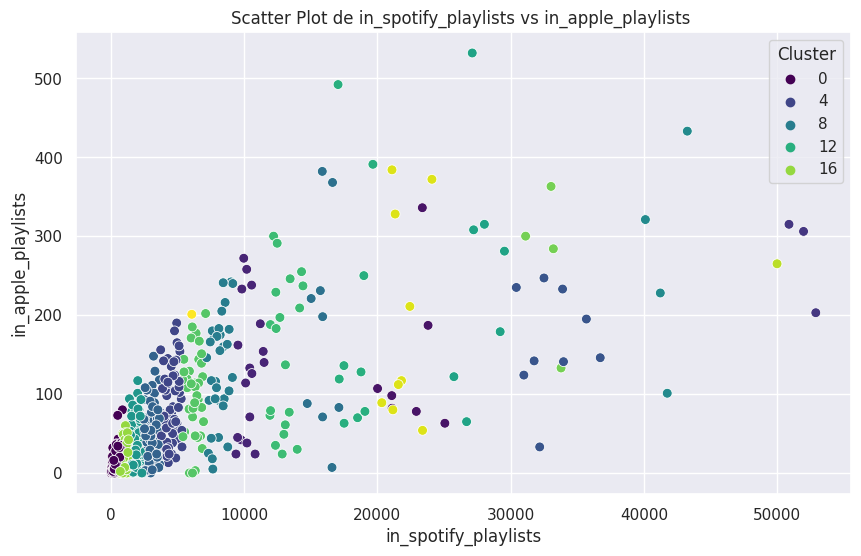

In [ ]:
features_for_kmeans = X_train.select_dtypes(include=['int64', 'float64'])

features_for_kmeans_no_missing = features_for_kmeans.dropna()

y_train_no_missing = y_train[features_for_kmeans.index.isin(features_for_kmeans_no_missing.index)]

kmeans_model = KMeans(n_clusters=20, random_state=42)

kmeans_model.fit(features_for_kmeans_no_missing)

etiquetas_entrenamiento = kmeans_model.labels_

feature1 = 'in_spotify_playlists'
feature2 = 'in_apple_playlists' #puede ser reemplazado por 'in_deezer_playlists'

features_for_kmeans_no_missing_with_labels = features_for_kmeans_no_missing.copy()
features_for_kmeans_no_missing_with_labels['Cluster'] = etiquetas_entrenamiento

plt.figure(figsize=(10, 6))
sns.scatterplot(x=feature1, y=feature2, hue='Cluster', data=features_for_kmeans_no_missing_with_labels, palette='viridis', s=50)
plt.title(f'Scatter Plot de {feature1} vs {feature2} ')
plt.xlabel(feature1)
plt.ylabel(feature2)
plt.legend(title='Cluster')
plt.show()

* Función para cada registro en el test retorne el cluster más cercano.

In [ ]:
def predecir_clusters(modelo_kmeans, datos_entrenamiento, datos_prueba):
    features_for_kmeans_prueba = datos_prueba[datos_entrenamiento.columns]

    features_for_kmeans_prueba_no_missing = features_for_kmeans_prueba.dropna()

    etiquetas_prueba = modelo_kmeans.predict(features_for_kmeans_prueba_no_missing)

    resultado = pd.DataFrame({'Cluster': etiquetas_prueba}, index=features_for_kmeans_prueba_no_missing.index)

    return resultado

etiquetas_prueba = predecir_clusters(kmeans_model, features_for_kmeans_no_missing, X_test)
print("Etiquetas de clústeres para el conjunto de prueba:")
print(etiquetas_prueba.head(5))

Etiquetas de clústeres para el conjunto de prueba:
     Cluster
199        9
420        6
694        4
750        8
826       16


* Función que para cada registro en test (cada fila) retorne tres registros (ejemplos de entrenamiento), de forma aleatoria, que también sean del cluster más cercano

In [ ]:
def obtener_ejemplos_cercanos(modelo_kmeans, datos_entrenamiento, datos_prueba, num_ejemplos_cercanos=3):
    columnas_comunes = datos_entrenamiento.columns.intersection(datos_prueba.columns)
    datos_entrenamiento = datos_entrenamiento[columnas_comunes]
    datos_prueba = datos_prueba[columnas_comunes]

    imputer = SimpleImputer(strategy='mean')
    datos_prueba_imputados = pd.DataFrame(imputer.fit_transform(datos_prueba), columns=datos_prueba.columns)

    clusters_entrenamiento = modelo_kmeans.predict(datos_entrenamiento)
    clusters_prueba = modelo_kmeans.predict(datos_prueba_imputados)

    ejemplos_cercanos = []

    for i in range(len(datos_prueba_imputados)):
        cluster_actual = clusters_prueba[i]

        indices_cluster_actual = np.where(clusters_entrenamiento == cluster_actual)[0]

        ejemplos_seleccionados = np.random.choice(indices_cluster_actual, num_ejemplos_cercanos, replace=True)

        ejemplos_cercanos.append(ejemplos_seleccionados)

    return ejemplos_cercanos

ejemplos_cercanos = obtener_ejemplos_cercanos(kmeans_model, features_for_kmeans_no_missing, X_test, num_ejemplos_cercanos=3)

print("Ejemplos cercanos para el primer registro de test:")
for i, ejemplo in enumerate(ejemplos_cercanos[0]):
    print(f"Ejemplo {i + 1}: {ejemplo}")

Ejemplos cercanos para el primer registro de test:
Ejemplo 1: 409
Ejemplo 2: 705
Ejemplo 3: 705


* Visualización de los datos utilizando PCA y tsne

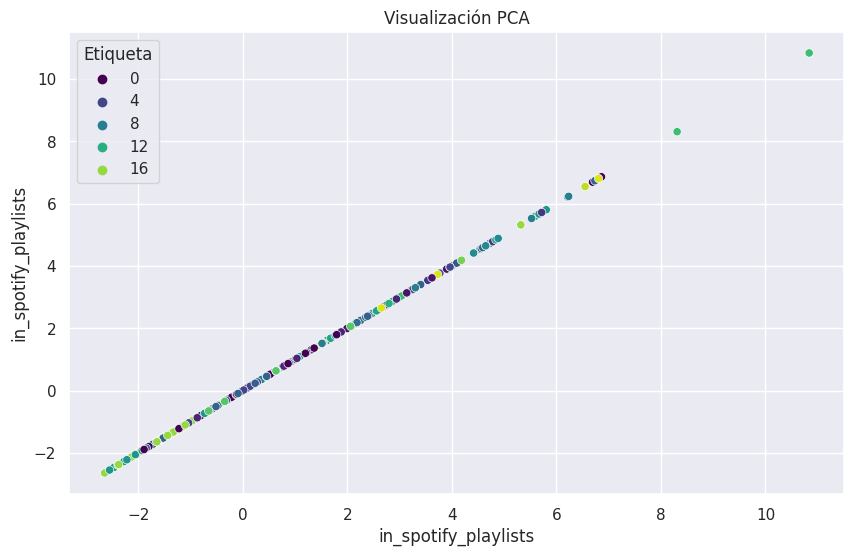

In [ ]:
def visualizar_con_pca(datos, etiquetas):
    pca = PCA(n_components=2)
    componentes_principales = pca.fit_transform(datos)

    df_pca = pd.DataFrame(data=componentes_principales, columns=['in_spotify_playlists', 'in_apple_playlists'])
    df_pca['Etiqueta'] = etiquetas

    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='in_spotify_playlists', y='in_spotify_playlists', hue='Etiqueta', data=df_pca, palette='viridis')
    plt.title('Visualización PCA')
    plt.show()

visualizar_con_pca(features_for_kmeans_no_missing_scaled, etiquetas_entrenamiento)

opcional

In [ ]:
%pip install spotipy -q

In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split

X = df_spmusic.drop(['streams', 'track_name', ], axis=1)

y_word_streams = df_spmusic['streams']

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y_word_streams)

X = X.apply(LabelEncoder().fit_transform)

scaler_streams = StandardScaler()
X = scaler_streams.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=21)

y_test = y_test / 100
y_train = y_train / 100
print(y_test.shape)


(191,)


In [ ]:
import tensorflow as tf
from tensorflow import keras

model_streams = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=[22]),
    tf.keras.layers.Dense(1024, activation=tf.nn.relu),
    tf.keras.layers.Dense(1024, activation=tf.nn.relu),
    tf.keras.layers.Dense(512, activation=tf.nn.relu),
    tf.keras.layers.Dense(512, activation=tf.nn.relu),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(1, activation=tf.nn.sigmoid)
])

model_streams.compile(optimizer=tf.keras.optimizers.Adam(),
                      loss='mse',
                      metrics=["mae"])

history = model_streams.fit(X_train, y_train, epochs=20, batch_size=20, validation_data=(X_test, y_test))

test_loss, test_acc = model_streams.evaluate(X_test, y_test)


Epoch 1/20
39/39 [==============================] - 3s 43ms/step - loss: 20.6822 - mae: 3.7512 - val_loss: 25.6985 - val_mae: 4.3303
Epoch 2/20
39/39 [==============================] - 2s 40ms/step - loss: 20.4836 - mae: 3.7314 - val_loss: 25.6985 - val_mae: 4.3303
Epoch 3/20
39/39 [==============================] - 1s 37ms/step - loss: 20.4836 - mae: 3.7314 - val_loss: 25.6985 - val_mae: 4.3303
Epoch 4/20
39/39 [==============================] - 2s 39ms/step - loss: 20.4836 - mae: 3.7314 - val_loss: 25.6985 - val_mae: 4.3303
Epoch 5/20
39/39 [==============================] - 1s 38ms/step - loss: 20.4836 - mae: 3.7314 - val_loss: 25.6985 - val_mae: 4.3303
Epoch 6/20
39/39 [==============================] - 2s 47ms/step - loss: 20.4836 - mae: 3.7314 - val_loss: 25.6985 - val_mae: 4.3303
Epoch 7/20
39/39 [==============================] - 2s 53ms/step - loss: 20.4836 - mae: 3.7314 - val_loss: 25.6985 - val_mae: 4.3303
Epoch 8/20
39/39 [==============================] - 2s 52ms/step - lo

In [ ]:
import pandas as pd
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split
from surprise import accuracy

columns_for_recommendation = ['track_name', 'artist(s)_name', 'streams']

df_spmusic = df[columns_for_recommendation]

reader = Reader(rating_scale=(df_spmusic['streams'].min(), df_spmusic['streams'].max()))
data = Dataset.load_from_df(df_spmusic, reader)

trainset, testset = train_test_split(data, test_size=0.2, random_state=42)

model = SVD()
model.fit(trainset)

predictions = model.test(testset)

accuracy.rmse(predictions)

user_id = 'user_1'
user_predictions = []
for item_id in df_spmusic['track_name'].unique():
    prediction = model.predict(user_id, item_id)
    artist_name = df_spmusic[df_spmusic['track_name'] == item_id]['artist(s)_name'].iloc[0]
    user_predictions.append({'track_name': item_id, 'artist(s)_name': artist_name, 'predicted_streams': prediction.est})

user_predictions = sorted(user_predictions, key=lambda x: x['predicted_streams'], reverse=True)

top_recommendations = pd.DataFrame(user_predictions[:10])
print(top_recommendations)


RMSE: 436.8874
                            track_name  artist(s)_name  predicted_streams
0                             Dua Lipa     Jack Harlow         948.000000
1                                Ghost   Justin Bieber         477.933706
2  Seven (feat. Latto) (Explicit Ver.)           Latto         475.022310
3                                 LALA     Myke Towers         475.022310
4                              vampire  Olivia Rodrigo         475.022310
5                         Cruel Summer    Taylor Swift         475.022310
6                       WHERE SHE GOES       Bad Bunny         475.022310
7                             Sprinter            Dave         475.022310
8                      Ella Baila Sola  Eslabon Armado         475.022310
9                             Columbia         Quevedo         475.022310
